# Lab 2 - Feature Generation, Feature Extraction & Feature Selection

-Anthony Allen, Parth Patel, Caijun Quin

# Feature Extraction & Feature Selection

The objective of Lab 2 is to introduce to the importance of pre-processing, normalization, feature generation, feature extraction and feature selection. You will develop, implement and compare several pre-processing pipelines on the collected project data sets. You will also implement feature visualization scripts and cluster validity-type metrics to aid in your pre-processing evaluation and visualization.

# Training Data Set

The training data set was collected from the entire class of EEL 4930. The training set contains 1844 samples of $100\times 100$ RGB images. 

The test data set will not be available until the end of the semester. It will have the same format as the training set.

Let's plot some sample images:

In [52]:
import numpy as np
import random
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.color import rgb2gray
import skimage.io as skimg
import skimage.color as color
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import sklearn.metrics as metrics
from skimage.feature import hog


In [2]:
Xtrain = np.load('train_data.npy')
ytrain = np.load('train_labels.npy')

Xtrain.shape, ytrain.shape

((1844, 100, 100, 3), (1844, 1))

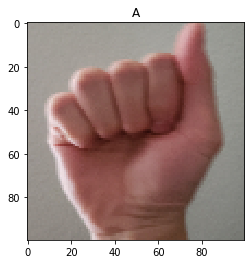

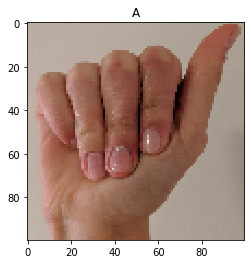

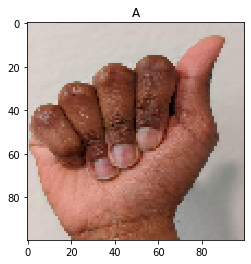

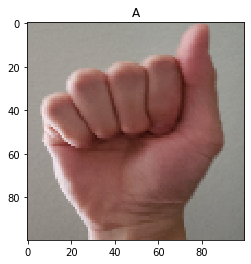

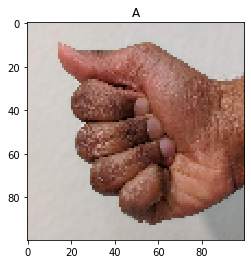

...

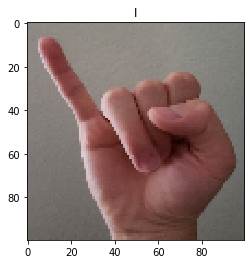

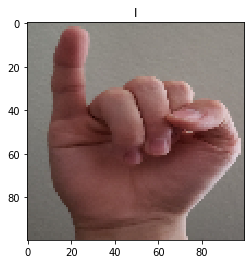

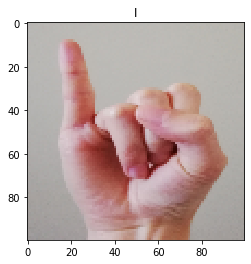

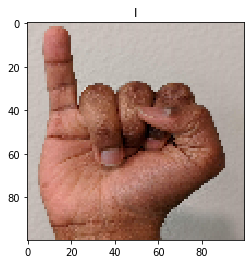

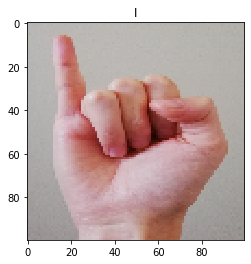

In [4]:
# Displaying a few Training Samples
labels = ['A','B','C','D','E','F','G','H','I']

for j in range(len(labels)):
    idx = list(np.where(ytrain == labels[j])[0])
    # Only displaying 10 random samples for each character
    for k in range(10):
        plt.imshow(Xtrain[idx[k],:,:,:]);
        plt.title(ytrain[idx[k]][0])
        plt.show();

# Problem 1

Provide a discussion about the quality of the training data set. Your discussion should include: 

1. Number of training samples per class
2. Dimensionality of feature space
3. Class representation (whether there is more than one dominant signing hand, alignment of signing hand, background, etc.)

This discussion may also include any *data impressions* that you may want to test in some other stage of your ML pipeline.

# Problem 2

In this problem, you will implement different pre-processing and normalization techniques for the training data. They should include:

1. Transformation of RGB channels to grayscale channel. You may use the function ```rgb2gray``` from ```skimage.color```.
2. RGB color channels normalization.

For each normalization technique, you should: (1) plot a few samples, and (2) discuss the advantages of each normalization technique versus others. You should also discuss the importance of data normalization in general.

For subsequent problems, you should choose a normalization technique or (preferred) compare performance among normalization techniques.

# RGB color channels normalization.

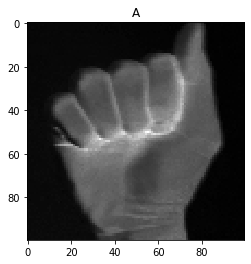

C:\Users\Paranoid_Android\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in true_divide
  


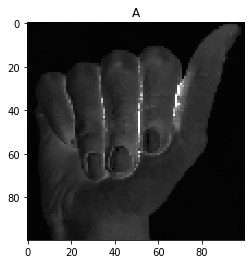

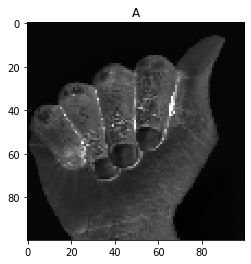

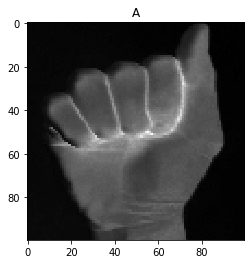

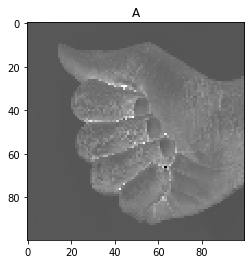

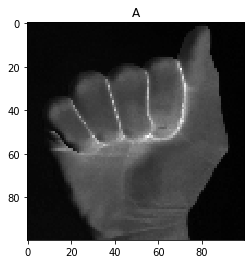

...

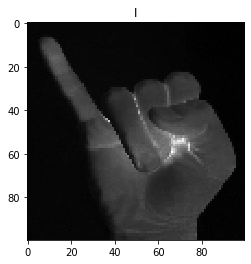

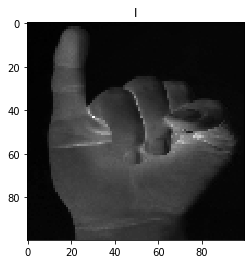

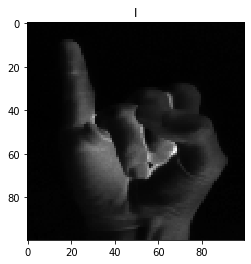

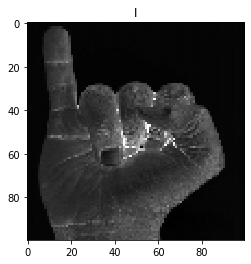

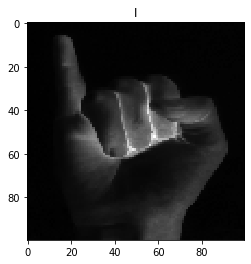

In [19]:

for j in range(len(labels)):
    idx = list(np.where(ytrain == labels[j])[0])
    for k in range(10):
        img = Xtrain[idx[k],:,:,:]
        S = np.sum(img,axis=2)
        newimg = np.zeros((100,100,3))
        for i in range(3):
            newimg[:,:,i] = np.divide(img[:,:,0],S)
        
        
        plt.imshow(rgb2gray(newimg),cmap='gray')
        plt.title(ytrain[idx[k]][0])
        plt.show();


In [20]:
Xtrain_255_norm = Xtrain/255

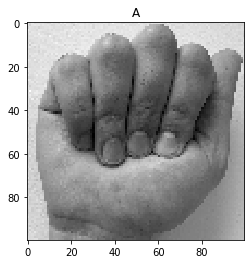

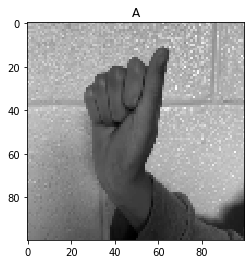

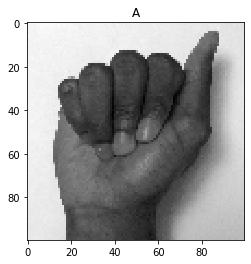

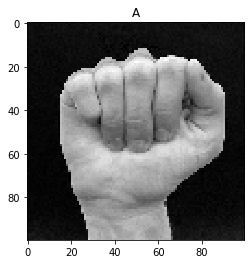

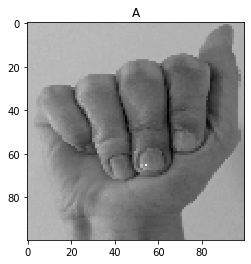

...

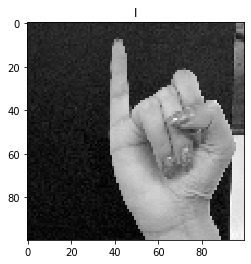

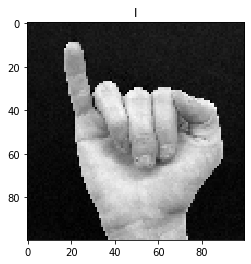

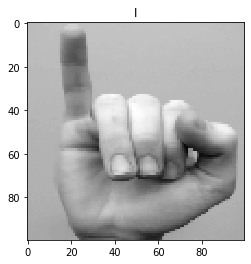

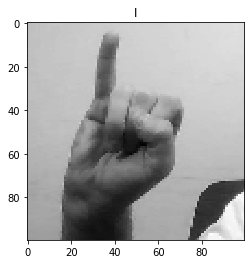

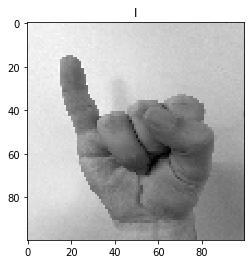

In [23]:
for j in range(len(labels)):
    idx = list(np.where(ytrain == labels[j])[0])
    for k in range(10):
       
        plt.imshow(color.rgb2grey( Xtrain_255_norm[idx[k],:,:,:]),cmap='gray')
        plt.title(ytrain[idx[k]][0])
        plt.show();

In [25]:
Xtrain_technique_1 = 2 * (Xtrain - Xtrain.min()) / (Xtrain.max() - Xtrain.min()) 

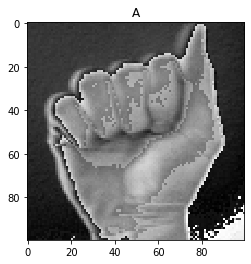

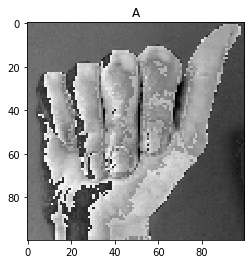

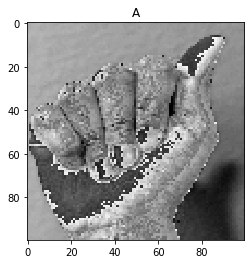

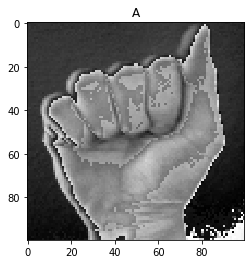

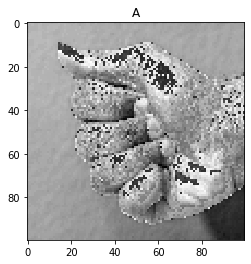

...

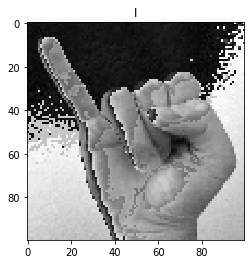

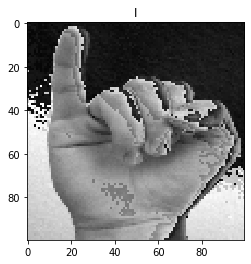

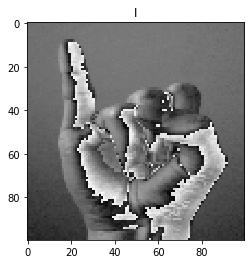

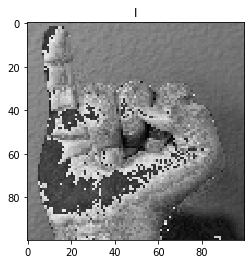

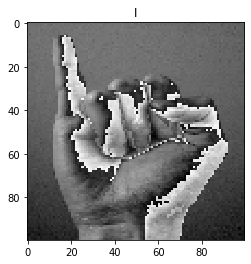

In [26]:
for j in range(len(labels)):
    idx = list(np.where(ytrain == labels[j])[0])
    for k in range(10):
       
        plt.imshow(color.rgb2grey(Xtrain_technique_1[idx[k],:,:,:]),cmap='gray')
        plt.title(ytrain[idx[k]][0])
        plt.show();

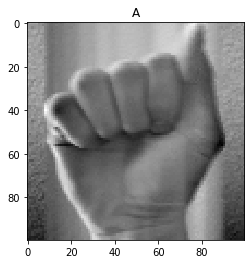

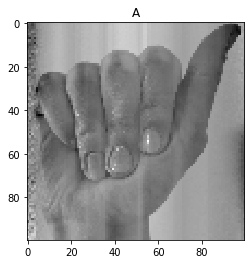

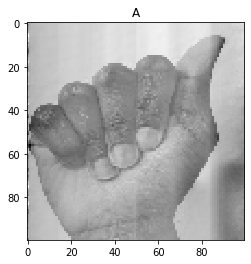

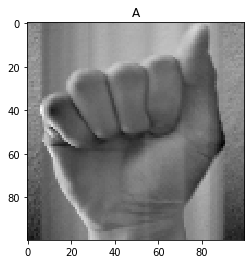

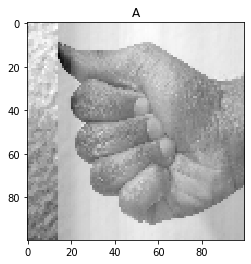

...

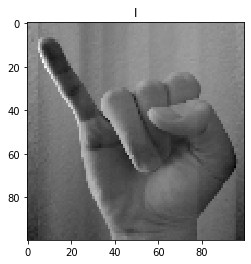

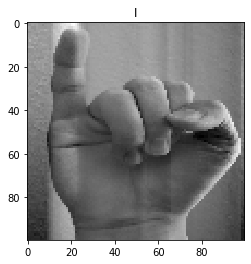

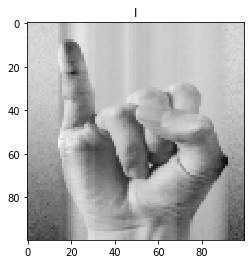

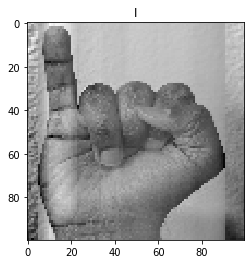

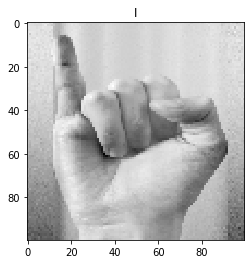

In [30]:
stdsc = StandardScaler()

for j in range(len(labels)):
    idx = list(np.where(ytrain == labels[j])[0])
    for k in range(10):   
        X_train_std = stdsc.fit_transform(color.rgb2grey(Xtrain[idx[k],:,:,:]))
       
        plt.imshow(rgb2gray(X_train_std),cmap='gray')
        plt.title(ytrain[idx[k]][0])
        plt.show();

# Problem 3

In this problem, you will generate features from the training set and assess the quality of the generated features by computing a set of cluster validity-type metrics.

You can experiment with several feature generators, but they should include:

1. PCA features on the original training set. **Provide a justification for the number of principal components you will choose.**

2. HOG features on the original training set. **Are HOG features sensitive to object orientation? Why?**

The *ideal* feature space will have class clusters far away from each other and compact class clusters. Compute the following metrics:

1. **Calinski-Harabasz Index**: The index is the ratio of the sum of between-clusters dispersion and of inter-cluster dispersion for all clusters (where dispersion is defined as the sum of distances squared). You may use the function ```calinski_harabasz_score``` from ```sklearn.metrics```.

2. **Davies-Bouldin Index**: This index computes the average similarity between clusters, where the similarity is a measure that compares the distance between clusters with the size of the clusters themselves. You may use the function ```davies_bouldin_score``` from ```sklearn.metrics```.

3. **Silhouette Index**: The silhouette index measures how well class group cluster together it estimates the average distance between clusters. You may use the function ```silhouette_score``` from ```sklearn.metrics```. 

4. **Pairwise Euclidean Distance**: The pairwise Euclidean distance measures how far away class mean are from each other. You may use the function ```pairwise_distances``` from ```sklearn.metrics```.

Include feature visualization by using histograms or heatmap (from ```seaborn```) plots.

Provide a discussion for your findings and remember to always justification your answers.

In [66]:
for j in range(len(labels)):
    idx = list(np.where(ytrain == labels[j])[0])
    for k in range(10):
       
        print(color.rgb2grey(Xtrain[idx[k],:,:,:]))
      

[[0.61114667 0.6240502  0.6240502  ... 0.5899098  0.57394078 0.57926902]
 [0.61815647 0.61480039 0.61480039 ... 0.59354863 0.57394078 0.60139176]
 [0.62041137 0.61285098 0.6024702  ... 0.57983451 0.58879373 0.57001922]
 ...
 [0.54364667 0.54139176 0.55232314 ... 0.47198    0.47198    0.46413686]
 [0.54531333 0.53188196 0.53188196 ... 0.46834118 0.46441961 0.46413686]
 [0.53608627 0.52907647 0.53354863 ... 0.46218745 0.46413686 0.45657647]]
[[0.70072471 0.69288157 0.68503843 ... 0.62678824 0.6307098  0.62454824]
 [0.69090941 0.68896    0.68111686 ... 0.61583412 0.6307098  0.62229333]
 [0.68896    0.68896    0.68615451 ... 0.47697725 0.61333412 0.62818706]
 ...
 [0.71248941 0.71248941 0.72033255 ... 0.61278353 0.60073608 0.58981961]
 [0.72425412 0.71641098 0.71641098 ... 0.61278353 0.59876392 0.59709725]
 [0.70773451 0.72033255 0.71641098 ... 0.61278353 0.60044549 0.60158431]]
[[0.81785098 0.82120706 0.82569412 ... 0.77471373 0.78283961 0.77863529]
 [0.80887686 0.81392941 0.82961569 ... 

In [67]:
grey_images = []
for image in Xtrain_technique_1:
    grey_images +=[color.rgb2grey(image).ravel()]

In [68]:
pca_data = dict()
pca = PCA()
pca_data = pca.fit_transform(grey_images)
print(pca.explained_variance_ratio_)

[2.30057978e-01 4.52711742e-02 3.57047146e-02 ... 4.56766263e-30
 2.85934980e-32 6.23786589e-36]


In [69]:
pca_data.shape

(1844, 1844)

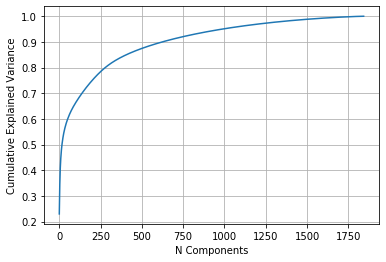

In [70]:
percentage_var_explained = pca.explained_variance_ / np.sum(pca.explained_variance_);
cum_var_explained = np.cumsum(percentage_var_explained)
plt.plot(cum_var_explained)
plt.grid()
plt.xlabel('N Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [76]:
for j in range(len(labels)):
    idx = list(np.where(ytrain == labels[j])[0])
    for k in range(99):   
        X_train_std = stdsc.fit_transform(color.rgb2grey(Xtrain[idx[k],:,:,:]))
print(stdsc.mean_)

[0.67481643 0.67595346 0.67562337 0.67686152 0.67543561 0.67750884
 0.68011061 0.67783357 0.67734907 0.67788089 0.67956687 0.67740427
 0.6778666  0.67816834 0.67797203 0.68075031 0.67943753 0.68417026
 0.68448123 0.68387693 0.6878433  0.68588236 0.68733937 0.68723601
 0.68759691 0.68931384 0.68945887 0.68594107 0.69340842 0.69413455
 0.69572311 0.69755427 0.69942746 0.69199245 0.686412   0.68753444
 0.68665058 0.68872938 0.69016415 0.69269386 0.68098026 0.67922025
 0.67660029 0.67073418 0.67111976 0.67004279 0.65966895 0.64954271
 0.64222003 0.64045369 0.62480399 0.62959385 0.6343049  0.62382876
 0.61243353 0.61674088 0.60897899 0.61166067 0.61566843 0.62462454
 0.61743658 0.62087829 0.62320884 0.63196571 0.63535271 0.6351488
 0.64276753 0.63785141 0.63612426 0.639212   0.64173776 0.64691457
 0.6508042  0.65224515 0.65142753 0.65365905 0.64923934 0.65217849
 0.65153774 0.66110524 0.66175785 0.66069821 0.66419505 0.66217763
 0.65946146 0.66433828 0.66545445 0.6635183  0.66787958 0.66450

In [77]:
xtrain_grey = color.rgb2gray(Xtrain)

C:\Users\Paranoid_Android\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


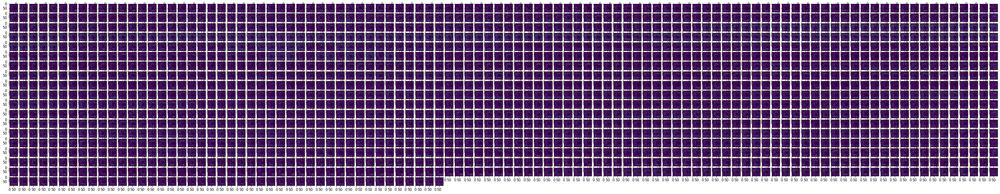

In [53]:
fig = plt.figure(figsize=(50, 50))
hog_data_visuals = dict()
hog_data_gradients = dict()
for image in range(len(Xtrain)):
    hog_data_gradients[image], hog_data_visuals[image]= hog(color.rgb2grey(Xtrain_technique_1[image]), visualize=True)
    sub = fig.add_subplot(100, 100, image + 1)
    sub.imshow(hog_data_visuals[image])
fig.show()

In [86]:
def normFeat(x):
    return x / np.sqrt(x @ x.T)

In [ ]:
# Parameters for gradient features
N_orientations = 4      # Number of directional gradients to compute
Cell_Size = (25, 25)  # Size of window to compute gradient 
NBlocks = (1,1)         # Number of blocks

for image in range(len(Xtrain)):
        img = Xtrain[idx[k],:,:,:]
        gradient1, visual = hog(img, orientations=N_orientations, pixels_per_cell=Cell_Size, cells_per_block=NBlocks,visualize=True)
        fig = plt.figure()
        fig.set_figheight(8)
        fig.set_figwidth(18)
        ax1 = fig.add_subplot(121)
        ax1.imshow(visual)
        ax1.title.set_text('HOG of Image')
        ax1.axis('off')

        #normalize the features
        gradient1 = normFeat(gradient1)

        plt.figure()
        plt.hist(gradient1, bins=15, alpha=0.5, label='HOG Image 1')
      

In [55]:
hog_data_array = np.array(list(hog_data_gradients.values()))

In [56]:
pca.n_features_

10000

In [57]:
metrics.calinski_harabaz_score(pca_data,ytrain)

C:\Users\Paranoid_Android\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:85: DeprecationWarning: Function calinski_harabaz_score is deprecated; Function 'calinski_harabaz_score' has been renamed to 'calinski_harabasz_score' and will be removed in version 0.23.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\Paranoid_Android\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


3.559216044810615

In [58]:
metrics.davies_bouldin_score(pca_data,ytrain)

C:\Users\Paranoid_Android\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


13.179788145154127

In [59]:
metrics.silhouette_score(pca_data,ytrain)

C:\Users\Paranoid_Android\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


-0.010288608704761837

In [60]:
metrics.pairwise_distances(pca_data)

array([[ 0.        , 24.61238222, 29.58135687, ..., 33.30162036,
        33.09037933, 32.68213683],
       [24.61238222,  0.        , 23.62928943, ..., 29.76614959,
        29.61865831, 29.22301424],
       [29.58135687, 23.62928943,  0.        , ..., 27.69925414,
        27.78150496, 27.53446159],
       ...,
       [33.30162036, 29.76614959, 27.69925414, ...,  0.        ,
        11.91944792, 15.82647699],
       [33.09037933, 29.61865831, 27.78150496, ..., 11.91944792,
         0.        , 15.83804285],
       [32.68213683, 29.22301424, 27.53446159, ..., 15.82647699,
        15.83804285,  0.        ]])

In [61]:
metrics.calinski_harabaz_score(hog_data_array, ytrain)

C:\Users\Paranoid_Android\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:85: DeprecationWarning: Function calinski_harabaz_score is deprecated; Function 'calinski_harabaz_score' has been renamed to 'calinski_harabasz_score' and will be removed in version 0.23.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\Paranoid_Android\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


10.313954793295377

In [62]:
metrics.silhouette_score(hog_data_array, ytrain)

C:\Users\Paranoid_Android\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.0051481808602665945

In [82]:
metrics.pairwise_distances(hog_data_array)

array([[0.        , 9.17638201, 8.56540507, ..., 9.3055778 , 9.33611028,
        9.29060068],
       [9.17638201, 0.        , 7.87894537, ..., 9.06639898, 9.21016461,
        8.90185898],
       [8.56540507, 7.87894537, 0.        , ..., 8.49530759, 8.60014532,
        8.41061271],
       ...,
       [9.3055778 , 9.06639898, 8.49530759, ..., 0.        , 4.43593913,
        5.98391373],
       [9.33611028, 9.21016461, 8.60014532, ..., 4.43593913, 0.        ,
        6.26281798],
       [9.29060068, 8.90185898, 8.41061271, ..., 5.98391373, 6.26281798,
        0.        ]])

In [64]:
metrics.davies_bouldin_score(hog_data_array,ytrain)

C:\Users\Paranoid_Android\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


8.919833495048156